In [ ]:
#! pip install grad-cam timm

In [1]:
import os
import cv2
import numpy as np
import pandas as pd
from math import ceil
from time import time
from tqdm.auto import tqdm
import multiprocessing as mp
from matplotlib import pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

import timm
import torch
import torchvision
import torchsummary
from torch import nn
from torch.optim import Adam
from torchvision import transforms, utils
from torch.utils.data import Dataset, DataLoader
#from torch.utils.tensorboard import SummaryWriter

from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, EigenGradCAM, LayerCAM, FullGrad

%matplotlib inline

c:\Users\hamma\AppData\Local\Programs\Python\Python38\lib\site-packages\setuptools\distutils_patch.py:25: UserWarning: Distutils was imported before Setuptools. This usage is discouraged and may exhibit undesirable behaviors or errors. Please use Setuptools' objects directly or at least import Setuptools first.
  warnings.warn(


In [2]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
device

'cpu'

In [4]:
def preprocess_image(img: np.ndarray, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], resized = (224, 224)) -> torch.Tensor:
  
  preprocessing = transforms.Compose([
                                      transforms.ToTensor(),
                                      transforms.Resize((224, 224)),
                                      transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
                                      ])
  return preprocessing(img.copy()).unsqueeze(0)


In [5]:
def reshape_transform(tensor, height=14, width=14):
  result = tensor[:, 1 :  , :].reshape(tensor.size(0),
                                       height, width, tensor.size(2))
  
  # Bring the channels to the first dimension,
  # like in CNNs.
  result = result.transpose(2, 3).transpose(1, 2)
  return result

In [6]:
model_vit_base_patch16_224 = timm.create_model('vit_base_patch16_224', pretrained = True, num_classes = 3,
                                               drop_rate = 0.2, attn_drop_rate = 0.2).to(device)

model_vit_base_patch16_224.load_state_dict(torch.load(f='C:/Users/hamma/Desktop/NCL/DS/11_FP_D/Code/Models/model_vit_base_patch16_224_1.pth',
                                                      map_location=torch.device(device)))

<All keys matched successfully>

In [7]:
model_vit_base_patch16_224.eval()

VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.2, inplace=False)
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (attn_drop): Dropout(p=0.2, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.2, inplace=False)
      )
      (drop_path): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU()
        (drop1): Dropout(p=0.2, inplace=False)
        (fc2): Linear(in_features=3072, out_features=768, bias=True)
        (drop2): Dropout(p=0.2, inplace=False)
      )
    )
    (1): Block(
      (norm1): LayerNorm((768,),

In [7]:
target_layer = [model_vit_base_patch16_224.blocks[-1].norm1]
target_layer

[LayerNorm((768,), eps=1e-06, elementwise_affine=True)]

In [12]:
model_vit_base_patch16_224

VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.2, inplace=False)
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (attn_drop): Dropout(p=0.2, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.2, inplace=False)
      )
      (drop_path): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU()
        (drop1): Dropout(p=0.2, inplace=False)
        (fc2): Linear(in_features=3072, out_features=768, bias=True)
        (drop2): Dropout(p=0.2, inplace=False)
      )
    )
    (1): Block(
      (norm1): LayerNorm((768,),

In [3]:
print('1')
img1 = cv2.resize(cv2.imread('C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/1.training/1.training/1003370-5631-24165-[1, 1, 0].png'), (224, 224))
print('2')
img2 = cv2.imread('C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/std_shape/1.training/1003370-5631-24165-[1, 1, 0].png')

1
2


In [11]:
type(img2)

numpy.ndarray

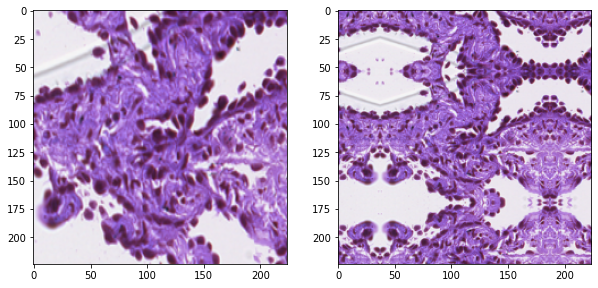

In [4]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(img1)

ax = fig.add_subplot(1, 2, 2)
plt.imshow(img2)

In [6]:
img1_1 = preprocess_image(img1).to(device)
img2_1 = preprocess_image(img2).to(device)

# 01. GradCAM

In [11]:
cam = GradCAM(model = model_vit_base_patch16_224, target_layers=target_layer,
              reshape_transform=reshape_transform)

In [20]:
grayscale_cam1 = cam(input_tensor=img1_1, targets=[ClassifierOutputTarget(np.array([2]))])
grayscale_cam2 = cam(input_tensor=img2_1, targets=[ClassifierOutputTarget(np.array([2]))])

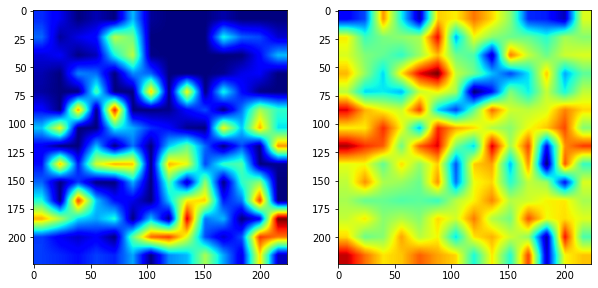

In [21]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 2, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

In [ ]:
show_cam_on_image(img1/255, grayscale_cam1[0, :])

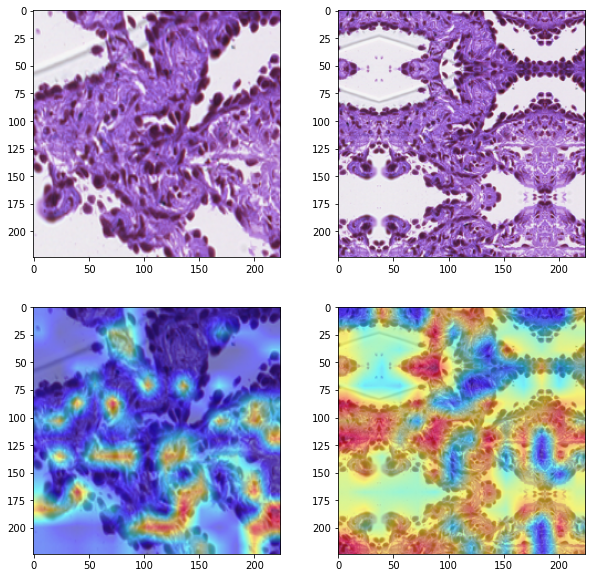

In [22]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(img1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(img2)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(img1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(img2/255, grayscale_cam2[0, :], use_rgb=True))

In [47]:
valid_img = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/img/00.png'
valid_maks = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/mask/00.png'

In [48]:
valid_img = cv2.resize(cv2.imread(valid_img), (224, 224))
valid_mask = cv2.resize(cv2.imread(valid_maks), (224, 224))

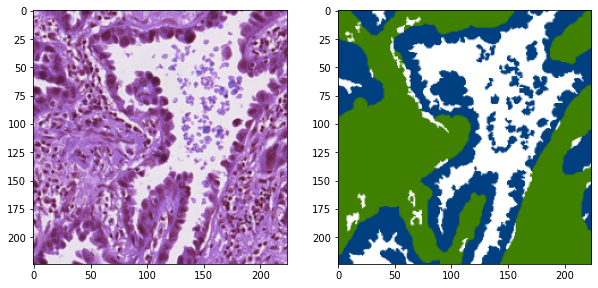

In [49]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

In [50]:
valid_img_1 = preprocess_image(valid_img).to(device)

In [53]:
prob = nn.functional.softmax(model_vit_base_patch16_224(valid_img_1), dim = -1)
prob

tensor([[1.0000e+00, 6.2970e-17, 8.9200e-15]], grad_fn=<SoftmaxBackward0>)

In [51]:
valid_cam_0 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([0]))])
valid_cam_1 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([1]))])
valid_cam_2 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([2]))])

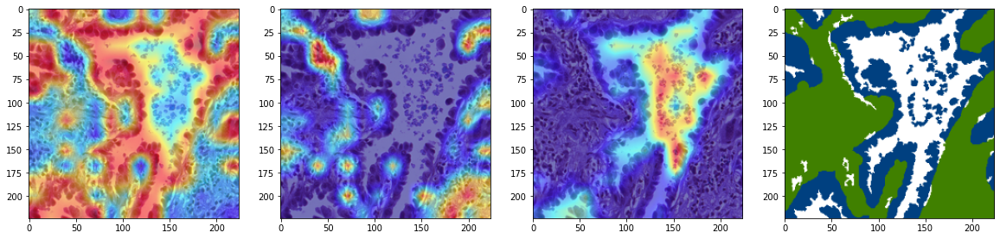

In [52]:
fig = plt.figure(figsize=(20, 40))
'''
ax = fig.add_subplot(1, 4, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 2)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 3)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 4)
plt.imshow(valid_img)
'''
ax = fig.add_subplot(1, 4, 1)
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_0[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 2)
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_1[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 3)
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_2[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 4)
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

In [54]:
t_ls_0 = [x.norm1 for x in model_vit_base_patch16_224.blocks]
t_ls_0

[LayerNorm((768,), eps=1e-06, elementwise_affine=True),
 LayerNorm((768,), eps=1e-06, elementwise_affine=True),
 LayerNorm((768,), eps=1e-06, elementwise_affine=True),
 LayerNorm((768,), eps=1e-06, elementwise_affine=True),
 LayerNorm((768,), eps=1e-06, elementwise_affine=True),
 LayerNorm((768,), eps=1e-06, elementwise_affine=True),
 LayerNorm((768,), eps=1e-06, elementwise_affine=True),
 LayerNorm((768,), eps=1e-06, elementwise_affine=True),
 LayerNorm((768,), eps=1e-06, elementwise_affine=True),
 LayerNorm((768,), eps=1e-06, elementwise_affine=True),
 LayerNorm((768,), eps=1e-06, elementwise_affine=True),
 LayerNorm((768,), eps=1e-06, elementwise_affine=True)]

In [55]:
t_ls = [[x.norm1] for x in model_vit_base_patch16_224.blocks]
t_ls

[[LayerNorm((768,), eps=1e-06, elementwise_affine=True)],
 [LayerNorm((768,), eps=1e-06, elementwise_affine=True)],
 [LayerNorm((768,), eps=1e-06, elementwise_affine=True)],
 [LayerNorm((768,), eps=1e-06, elementwise_affine=True)],
 [LayerNorm((768,), eps=1e-06, elementwise_affine=True)],
 [LayerNorm((768,), eps=1e-06, elementwise_affine=True)],
 [LayerNorm((768,), eps=1e-06, elementwise_affine=True)],
 [LayerNorm((768,), eps=1e-06, elementwise_affine=True)],
 [LayerNorm((768,), eps=1e-06, elementwise_affine=True)],
 [LayerNorm((768,), eps=1e-06, elementwise_affine=True)],
 [LayerNorm((768,), eps=1e-06, elementwise_affine=True)],
 [LayerNorm((768,), eps=1e-06, elementwise_affine=True)]]

In [ ]:
type(t_ls[0])

list

In [56]:
cams_0 = GradCAM(model = model_vit_base_patch16_224, target_layers=t_ls_0, reshape_transform=reshape_transform)

In [57]:
cams = [GradCAM(model = model_vit_base_patch16_224, target_layers=x, reshape_transform=reshape_transform) for x in t_ls]

In [58]:
test_cams = [x(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([0]))]) for x in cams]
test_cams_0 = cams_0(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([0]))])

In [59]:
test_cam_mean = np.mean(np.array(test_cams), axis = 0)
test_cam_sum = np.array(test_cams).sum(axis=0)

In [60]:
test_cam_max = np.vstack(test_cams).max(axis=0)

In [ ]:
test_cam_mean.shape
test_cam_sum.shape

(1, 224, 224)

In [ ]:
test_cam_max.shape

(224, 224)

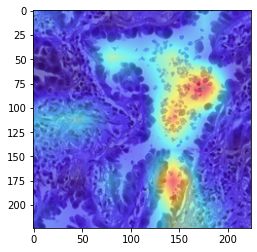

In [ ]:
plt.imshow(show_cam_on_image(valid_img/255, test_cam_mean[0, :], use_rgb=True))

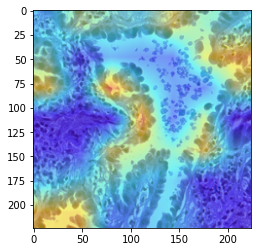

In [ ]:
plt.imshow(show_cam_on_image(valid_img/255, test_cam_mean[0, :], use_rgb=True))

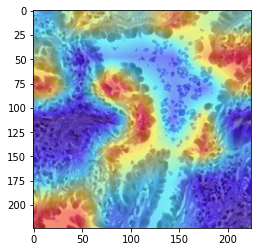

In [ ]:
plt.imshow(show_cam_on_image(valid_img/255, ((test_cam_sum - np.min(test_cam_sum))/np.ptp(test_cam_sum))[0, :], use_rgb=True))

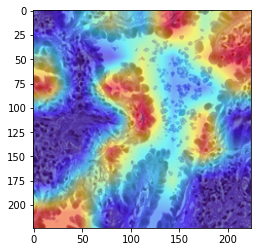

In [ ]:
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_0[0, :], use_rgb=True))

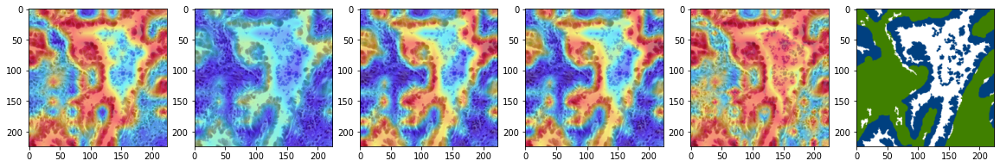

In [61]:
fig = plt.figure(figsize=(20, 20))

ax = fig.add_subplot(2, 6, 1)
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_0[0, :], use_rgb=True))     # from just the last block

ax = fig.add_subplot(2, 6, 2)
plt.imshow(show_cam_on_image(valid_img/255, test_cam_mean[0, :], use_rgb=True))   # mean of the cams from all blocks

ax = fig.add_subplot(2, 6, 3)
plt.imshow(show_cam_on_image(valid_img/255, ((test_cam_sum - np.min(test_cam_sum))/np.ptp(test_cam_sum))[0, :], use_rgb=True)) # Normalized sum of all cams

ax = fig.add_subplot(2, 6, 4)
plt.imshow(show_cam_on_image(valid_img/255, test_cams_0[0, :], use_rgb=True))     # passing the whole list of layers

ax = fig.add_subplot(2, 6, 5)
plt.imshow(show_cam_on_image(valid_img/255, test_cam_max, use_rgb=True))     # max of all cams

ax = fig.add_subplot(2, 6, 6)
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

In [ ]:
test_cam_min = np.vstack(test_cams).min(axis=0)
test_cam_min.shape

(224, 224)

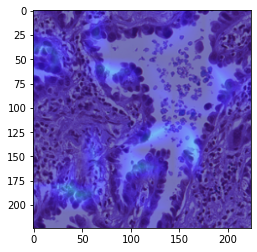

In [ ]:
plt.imshow(show_cam_on_image(valid_img/255, test_cam_min, use_rgb=True))

# 02. ScoreCAM

In [64]:
cam = ScoreCAM(model = model_vit_base_patch16_224, target_layers=target_layer,
               reshape_transform=reshape_transform)

In [67]:
valid_img = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/img/00.png'
valid_maks = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/mask/00.png'

In [68]:
valid_img = cv2.resize(cv2.imread(valid_img), (224, 224))
valid_mask = cv2.resize(cv2.imread(valid_maks), (224, 224))

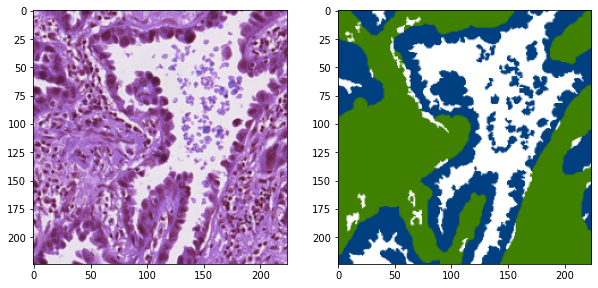

In [69]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

In [70]:
valid_img_1 = preprocess_image(valid_img).to(device)

In [71]:
valid_cam_0 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([0]))])
valid_cam_1 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([1]))])
valid_cam_2 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([2]))])

100%|██████████| 48/48 [08:35<00:00, 10.74s/it]


In [72]:
print(valid_cam_0.shape)
print(valid_cam_1.shape)
print(valid_cam_2.shape)

(1, 224, 224)
(1, 224, 224)
(1, 224, 224)


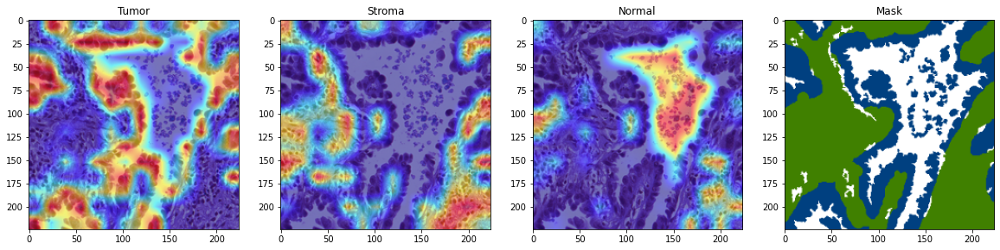

In [73]:
fig = plt.figure(figsize=(20, 40))
'''
ax = fig.add_subplot(1, 4, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 2)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 3)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 4)
plt.imshow(valid_img)
'''
ax = fig.add_subplot(1, 4, 1)
ax.title.set_text('Tumor')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_0[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 2)
ax.title.set_text('Stroma')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_1[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 3)
ax.title.set_text('Normal')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_2[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 4)
ax.title.set_text('Mask')
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

# 03. GradCAM++

In [9]:
cam = GradCAMPlusPlus(model = model_vit_base_patch16_224, target_layers=target_layer,
                      reshape_transform=reshape_transform)

In [10]:
valid_img = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/img/00.png'
valid_maks = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/mask/00.png'

In [11]:
valid_img = cv2.resize(cv2.imread(valid_img), (224, 224))
valid_mask = cv2.resize(cv2.imread(valid_maks), (224, 224))

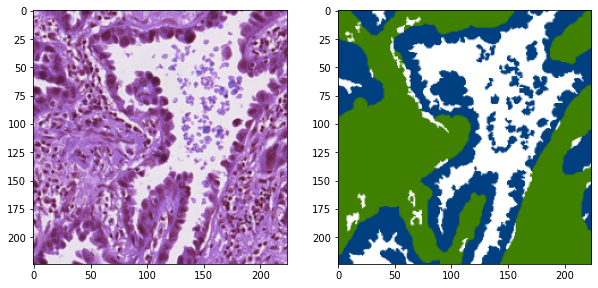

In [79]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

In [12]:
valid_img_1 = preprocess_image(valid_img).to(device)

In [13]:
valid_cam_0 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([0]))])
valid_cam_1 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([1]))])
valid_cam_2 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([2]))])

In [82]:
print(valid_cam_0.shape)
print(valid_cam_1.shape)
print(valid_cam_2.shape)

(1, 224, 224)
(1, 224, 224)
(1, 224, 224)


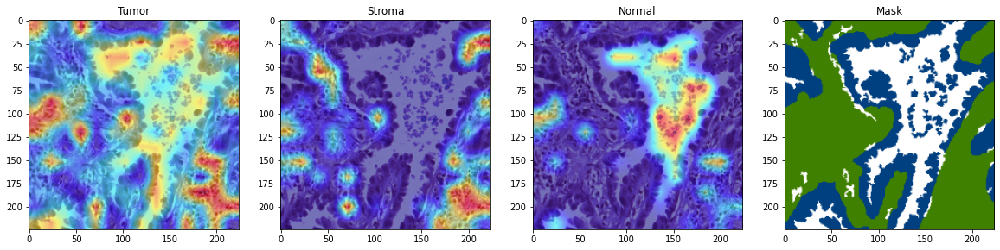

In [14]:
fig = plt.figure(figsize=(20, 40))
'''
ax = fig.add_subplot(1, 4, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 2)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 3)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 4)
plt.imshow(valid_img)
'''
ax = fig.add_subplot(1, 4, 1)
ax.title.set_text('Tumor')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_0[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 2)
ax.title.set_text('Stroma')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_1[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 3)
ax.title.set_text('Normal')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_2[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 4)
ax.title.set_text('Mask')
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

# 04. AblationCAM

In [15]:
from pytorch_grad_cam.ablation_layer import AblationLayerVit

In [16]:
cam = AblationCAM(model = model_vit_base_patch16_224, target_layers=target_layer,
                  reshape_transform=reshape_transform, ablation_layer=AblationLayerVit())

In [ ]:
valid_img = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/img/00.png'
valid_maks = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/mask/00.png'

In [ ]:
valid_img = cv2.resize(cv2.imread(valid_img), (224, 224))
valid_mask = cv2.resize(cv2.imread(valid_maks), (224, 224))

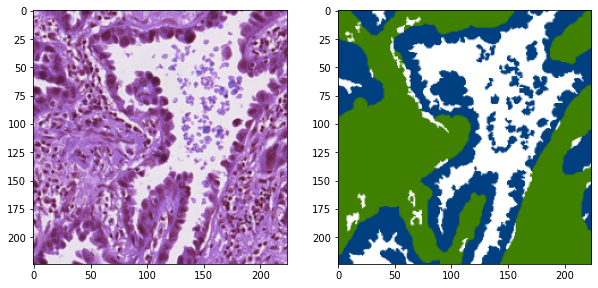

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

In [92]:
valid_img_1 = preprocess_image(valid_img).to(device)

In [17]:
valid_cam_0 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([0]))])
valid_cam_1 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([1]))])
valid_cam_2 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([2]))])

100%|██████████| 24/24 [09:36<00:00, 24.03s/it]


In [18]:
print(valid_cam_0.shape)
print(valid_cam_1.shape)
print(valid_cam_2.shape)

(1, 224, 224)
(1, 224, 224)
(1, 224, 224)


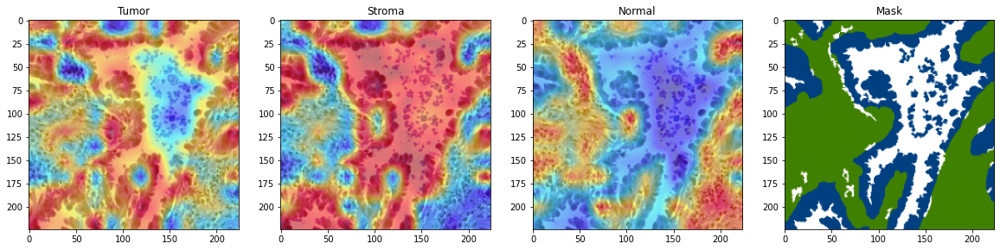

In [19]:
fig = plt.figure(figsize=(20, 40))
'''
ax = fig.add_subplot(1, 4, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 2)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 3)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 4)
plt.imshow(valid_img)
'''
ax = fig.add_subplot(1, 4, 1)
ax.title.set_text('Tumor')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_0[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 2)
ax.title.set_text('Stroma')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_1[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 3)
ax.title.set_text('Normal')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_2[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 4)
ax.title.set_text('Mask')
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

# 05. XGradCAM++

In [20]:
cam = XGradCAM(model = model_vit_base_patch16_224, target_layers=target_layer,
               reshape_transform=reshape_transform)

In [ ]:
valid_img = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/img/00.png'
valid_maks = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/mask/00.png'

In [ ]:
valid_img = cv2.resize(cv2.imread(valid_img), (224, 224))
valid_mask = cv2.resize(cv2.imread(valid_maks), (224, 224))

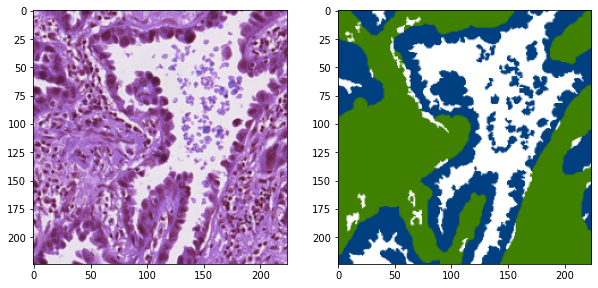

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

In [ ]:
valid_img_1 = preprocess_image(valid_img).to(device)

In [21]:
valid_cam_0 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([0]))])
valid_cam_1 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([1]))])
valid_cam_2 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([2]))])

In [22]:
print(valid_cam_0.shape)
print(valid_cam_1.shape)
print(valid_cam_2.shape)

(1, 224, 224)
(1, 224, 224)
(1, 224, 224)


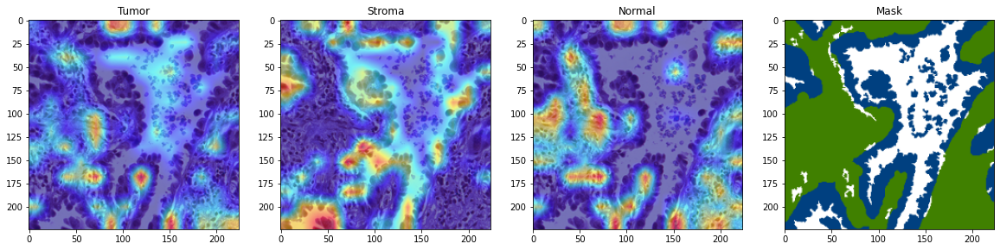

In [23]:
fig = plt.figure(figsize=(20, 40))
'''
ax = fig.add_subplot(1, 4, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 2)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 3)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 4)
plt.imshow(valid_img)
'''
ax = fig.add_subplot(1, 4, 1)
ax.title.set_text('Tumor')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_0[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 2)
ax.title.set_text('Stroma')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_1[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 3)
ax.title.set_text('Normal')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_2[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 4)
ax.title.set_text('Mask')
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

# 06. EigenCAM

In [24]:
cam =EigenCAM(model = model_vit_base_patch16_224, target_layers=target_layer,
              reshape_transform=reshape_transform)

In [ ]:
valid_img = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/img/00.png'
valid_maks = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/mask/00.png'

In [ ]:
valid_img = cv2.resize(cv2.imread(valid_img), (224, 224))
valid_mask = cv2.resize(cv2.imread(valid_maks), (224, 224))

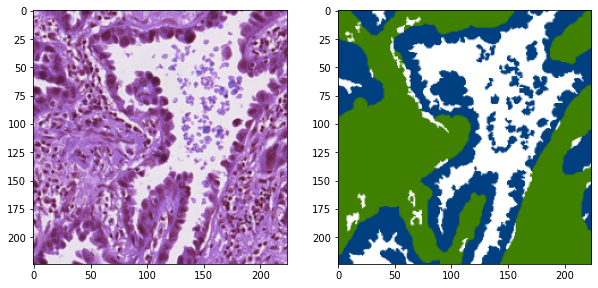

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

In [ ]:
valid_img_1 = preprocess_image(valid_img).to(device)

In [25]:
valid_cam_0 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([0]))])
valid_cam_1 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([1]))])
valid_cam_2 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([2]))])

In [ ]:
print(valid_cam_0.shape)
print(valid_cam_1.shape)
print(valid_cam_2.shape)

(1, 224, 224)
(1, 224, 224)
(1, 224, 224)


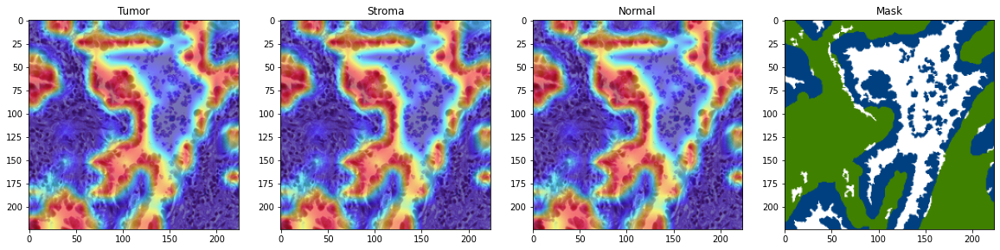

In [26]:
fig = plt.figure(figsize=(20, 40))
'''
ax = fig.add_subplot(1, 4, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 2)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 3)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 4)
plt.imshow(valid_img)
'''
ax = fig.add_subplot(1, 4, 1)
ax.title.set_text('Tumor')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_0[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 2)
ax.title.set_text('Stroma')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_1[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 3)
ax.title.set_text('Normal')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_2[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 4)
ax.title.set_text('Mask')
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

# 07. EigenGradCAM

In [27]:
cam = EigenGradCAM(model = model_vit_base_patch16_224, target_layers=target_layer,
                      reshape_transform=reshape_transform)

In [ ]:
valid_img = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/img/00.png'
valid_maks = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/mask/00.png'

In [ ]:
valid_img = cv2.resize(cv2.imread(valid_img), (224, 224))
valid_mask = cv2.resize(cv2.imread(valid_maks), (224, 224))

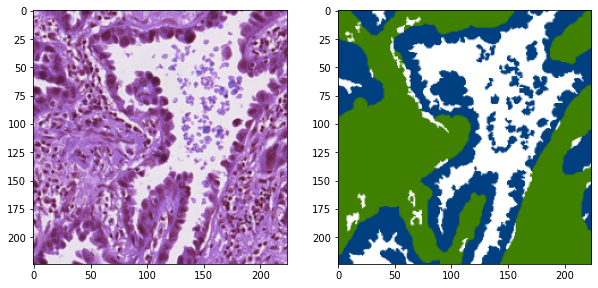

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

In [ ]:
valid_img_1 = preprocess_image(valid_img).to(device)

In [28]:
valid_cam_0 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([0]))])
valid_cam_1 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([1]))])
valid_cam_2 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([2]))])

In [ ]:
print(valid_cam_0.shape)
print(valid_cam_1.shape)
print(valid_cam_2.shape)

(1, 224, 224)
(1, 224, 224)
(1, 224, 224)


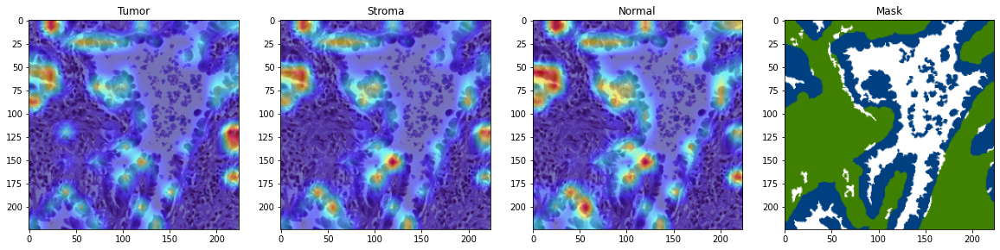

In [30]:
fig = plt.figure(figsize=(20, 40))
'''
ax = fig.add_subplot(1, 4, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 2)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 3)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 4)
plt.imshow(valid_img)
'''
ax = fig.add_subplot(1, 4, 1)
ax.title.set_text('Tumor')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_0[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 2)
ax.title.set_text('Stroma')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_1[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 3)
ax.title.set_text('Normal')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_2[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 4)
ax.title.set_text('Mask')
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

# 08. LayerCAM

In [31]:
cam = LayerCAM(model = model_vit_base_patch16_224, target_layers=target_layer,
                      reshape_transform=reshape_transform)

In [ ]:
valid_img = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/img/00.png'
valid_maks = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/mask/00.png'

In [ ]:
valid_img = cv2.resize(cv2.imread(valid_img), (224, 224))
valid_mask = cv2.resize(cv2.imread(valid_maks), (224, 224))

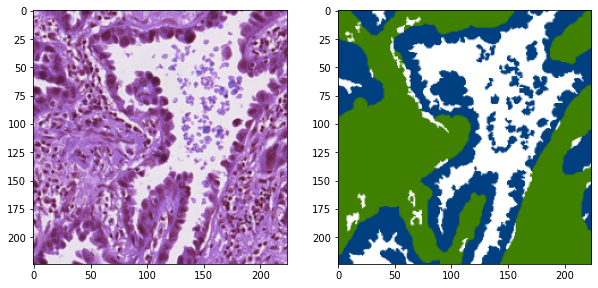

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

In [ ]:
valid_img_1 = preprocess_image(valid_img).to(device)

In [32]:
valid_cam_0 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([0]))])
valid_cam_1 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([1]))])
valid_cam_2 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([2]))])

In [ ]:
print(valid_cam_0.shape)
print(valid_cam_1.shape)
print(valid_cam_2.shape)

(1, 224, 224)
(1, 224, 224)
(1, 224, 224)


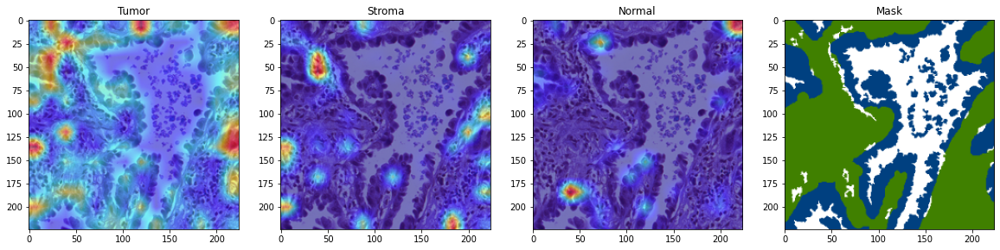

In [33]:
fig = plt.figure(figsize=(20, 40))
'''
ax = fig.add_subplot(1, 4, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 2)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 3)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 4)
plt.imshow(valid_img)
'''
ax = fig.add_subplot(1, 4, 1)
ax.title.set_text('Tumor')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_0[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 2)
ax.title.set_text('Stroma')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_1[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 3)
ax.title.set_text('Normal')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_2[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 4)
ax.title.set_text('Mask')
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

# 09. FullGrad

In [8]:
cam = FullGrad(model = model_vit_base_patch16_224, target_layers=target_layer,
                      reshape_transform=reshape_transform)

In [14]:
valid_img = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/img/00.png'
valid_maks = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/mask/00.png'

In [15]:
valid_img = cv2.resize(cv2.imread(valid_img), (224, 224))
valid_mask = cv2.resize(cv2.imread(valid_maks), (224, 224))

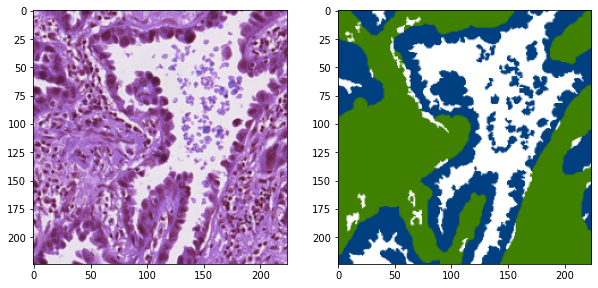

In [16]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

In [17]:
valid_img_1 = preprocess_image(valid_img).to(device)

In [15]:
valid_cam_0 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([0]))])
valid_cam_1 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([1]))])
valid_cam_2 = cam(input_tensor=valid_img_1, targets=[ClassifierOutputTarget(np.array([2]))])

RuntimeError: shape '[1, 14, 14, 14]' is invalid for input of size 150332

In [ ]:
print(valid_cam_0.shape)
print(valid_cam_1.shape)
print(valid_cam_2.shape)

(1, 224, 224)
(1, 224, 224)
(1, 224, 224)


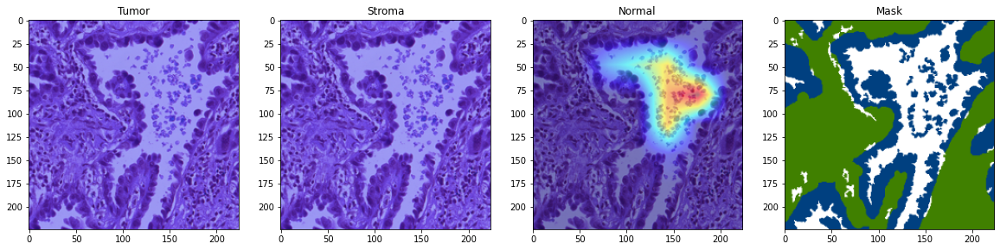

In [ ]:
fig = plt.figure(figsize=(20, 40))
'''
ax = fig.add_subplot(1, 4, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 2)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 3)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 4)
plt.imshow(valid_img)
'''
ax = fig.add_subplot(1, 4, 1)
ax.title.set_text('Tumor')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_0[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 2)
ax.title.set_text('Stroma')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_1[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 3)
ax.title.set_text('Normal')
plt.imshow(show_cam_on_image(valid_img/255, valid_cam_2[0, :], use_rgb=True))

ax = fig.add_subplot(1, 4, 4)
ax.title.set_text('Mask')
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

# Explainability for Vision Transformers (JacobGil)

In [ ]:
!rm -r vit_explain

In [16]:
!git clone https://github.com/jacobgil/vit-explain vit_explain

Cloning into 'vit_explain'...


In [17]:
from vit_explain.vit_rollout import VITAttentionRollout
from vit_explain.vit_grad_rollout import VITAttentionGradRollout

In [ ]:
valid_img = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/img/00.png'
valid_maks = 'C:/Users/hamma/Desktop/NCL/DS/11_FP_D/WSSS4LUAD-20220422T171928Z-001/WSSS4LUAD/2.validation/2.validation/mask/00.png'

In [ ]:
valid_img = cv2.resize(cv2.imread(valid_img), (224, 224))
valid_mask = cv2.resize(cv2.imread(valid_maks), (224, 224))

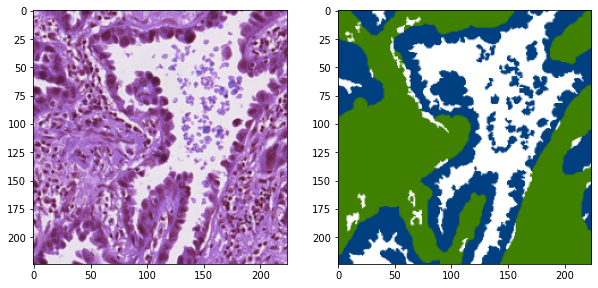

In [18]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

In [ ]:
valid_img_1 = preprocess_image(valid_img).to(device)

## Vanilla Attention rollout

In [19]:
attention_rollout = VITAttentionRollout(model_vit_base_patch16_224, head_fusion='max',
                                        discard_ratio=0.5)

In [20]:
cam = attention_rollout(valid_img_1)
cam.shape

RuntimeError: shape '[1, 14, 14, 14]' is invalid for input of size 150332

In [ ]:
grad_rollout = VITAttentionGradRollout(model_vit_base_patch16_224, discard_ratio=0.9)

In [ ]:
cam = attention_rollout(valid_img_1)
cam.shape

RuntimeError: ignored

In [18]:
out = model_vit_base_patch16_224(valid_img_1)
out

tensor([[ 24.2330, -13.0709,  -8.1175]], grad_fn=<AddmmBackward0>)

In [21]:
nn.functional.sigmoid(out[0]).round()

c:\Users\hamma\AppData\Local\Programs\Python\Python38\lib\site-packages\torch\nn\functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


tensor([1., 0., 0.], grad_fn=<RoundBackward0>)

In [26]:
nn.functional.softmax(out[0]).round().detach().numpy().astype('int')

C:\Users\hamma\AppData\Local\Temp/ipykernel_10684/2348270810.py:1: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  nn.functional.softmax(out[0]).round().detach().numpy().astype('int')


array([1, 0, 0])

In [27]:
str([1, 2, 3])

'[1, 2, 3]'

# EscVM

Trying to viz attention in the images via work from https://github.com/EscVM/EscVM_YT. shows individual patches which contribute the best. Better to use and continue woring on the above implementations

In [ ]:
!git clone https://github.com/EscVM/EscVM_YT

Cloning into 'EscVM_YT'...
remote: Enumerating objects: 444, done.
remote: Total 444 (delta 0), reused 0 (delta 0), pack-reused 444
Receiving objects: 100% (444/444), 96.58 MiB | 24.06 MiB/s, done.
Resolving deltas: 100% (157/157), done.


In [ ]:
from vision_transformers import VisionTransformer as ViT
from preprocess import visualize_attention

In [ ]:
test_model = ViT(img_size=(224, 224), patch_size=32, num_classes=3,
                 drop_rate=0.2, attn_drop_rate=0.2, qkv_bias=True).to(device)

In [ ]:
test_model.load_state_dict(torch.load(f='/content/drive/MyDrive/Newcastle University/Final Project and Dissertation/Models/model_vit_base_patch16_224_1.pth',
                                      map_location=torch.device(device)))

<All keys matched successfully>

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Newcastle University/Final Project and Dissertation/Dataset/Original/2.validation/2.validation/img/00.png')

In [ ]:
img.shape

(273, 266, 3)

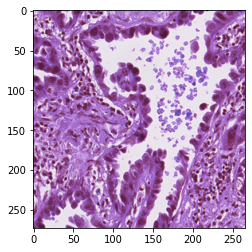

In [ ]:
plt.imshow(img)

In [ ]:
img_01 = preprocess_image(img)

In [ ]:
img_01.shape

torch.Size([1, 3, 224, 224])

In [ ]:
type(img_01) == torch.Tensor

True

In [ ]:
b, nc, h, w = img_01.shape

In [ ]:
b, nc, w, h

(1, 3, 224, 224)

In [ ]:
test_model.get_last_selfattention(img_01.to(device)).shape

torch.Size([1, 12, 50, 50])

In [ ]:
def visualize_attentions(model, img, patch_size, device):
  # make the image divisible by the patch size
  w, h = img.shape[1] - img.shape[1] % patch_size, img.shape[2] - img.shape[2] % patch_size
  #img = img[:, :w, :h].unsqueeze(0)
  
  h_featmap = img.shape[-2] // patch_size
  w_featmap = img.shape[-1] // patch_size
  
  attentions = model.get_last_selfattention(img.to(device))
  
  nh = attentions.shape[1] # number of head
  
  # keep only the output patch attention
  attentions = attentions[0, :, 0, 1:].reshape(nh, -1)
  
  attentions = attentions.reshape(nh, w_featmap, h_featmap)
  attentions = nn.functional.interpolate(attentions.unsqueeze(0), scale_factor=patch_size, mode="nearest")[0].detach().numpy()
  
  return attentions

In [ ]:
def plot_attentions(img, attention):
  n_heads = attention.shape[0]
  plt.figure(figsize=(10,10))
  text = ["Original Image", "Head Mean"]
  for i, fig in enumerate([img, np.mean(attention, 0)]):
    plt.subplot(1, 2, i+1)
    print(i)
    if type(fig) == torch.Tensor:
      fig = fig.squeeze().detach().numpy()
    else:
      fig = fig.squeeze()
    #print(fig.shape)
    if len(fig.shape) > 2:
      plt.imshow(np.moveaxis(fig, 0, 2), cmap='jet')
    else:
      plt.imshow(fig, cmap='jet')
    plt.title(text[i])
  plt.show()
  
  plt.figure(figsize=(10,10))    
  for i in range(n_heads):
    plt.subplot(n_heads//3,3, i+1)
    plt.imshow(attention[i], cmap='jet')
    plt.title(f"Head n: {i+1}")
  plt.tight_layout()
  plt.show()

In [ ]:
#visualize_predict(test_model, valid_img_1, (224, 224), 32, device)

attention = visualize_attentions(test_model, img_01, 32, device)

In [ ]:
attention.shape

(12, 224, 224)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0
1


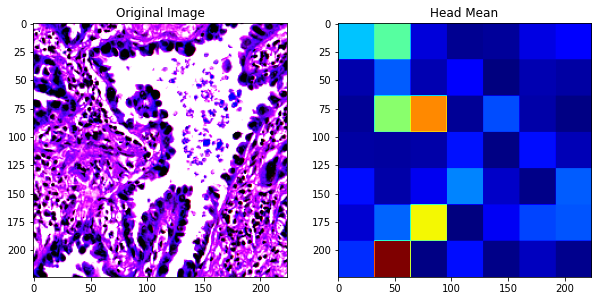

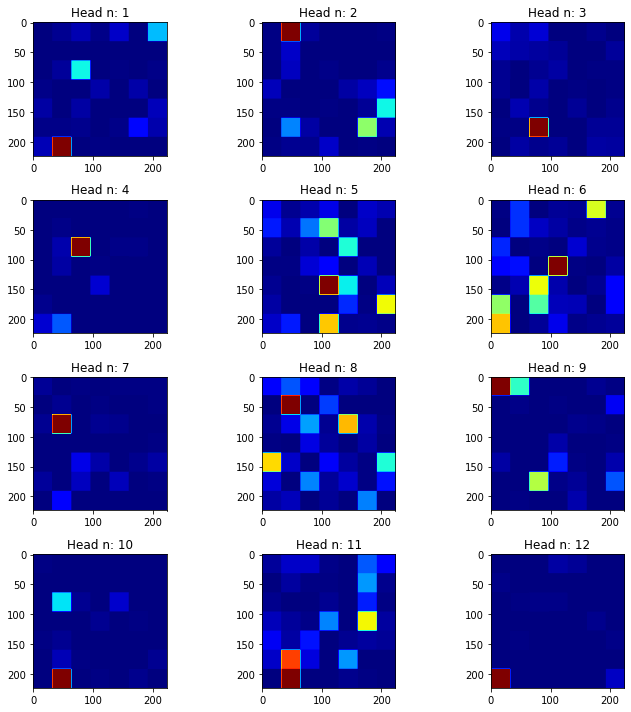

In [ ]:
plot_attentions(img_01, attention)